In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

     |████████████████████████████████| 274 kB 19.5 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=b63c2d5290746ef1ad0a9b6a349bba1b25ecf9b980a972655c102e883ed180bd
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html
     |████████████████████████████████| 7.0 MB 623 kB/s 
     |████████████████████████████████| 145 kB 31.7 MB/s 
     |████████████████████████████████| 55 kB 3.5 MB/s 
     |████████████████████████████████| 74 kB 4.2 MB/s 
     |████████████████████████████████| 130 kB 71.3 MB/s 
     |████████████████████████████████| 843 kB 66.1 MB/s 
     |██████████████████████████████

In [ ]:

# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [22]:
# register datasets
from detectron2.data.datasets import register_coco_instances
register_coco_instances("cassava3_train", {}, "/content/drive/MyDrive/images/train/output.json", "/content/drive/MyDrive/images/train")
register_coco_instances("cassava3_test", {}, "/content/drive/MyDrive/images/val/output.json", "/content/drive/MyDrive/images/val")

In [23]:
# visualise training set
sample_metadata = MetadataCatalog.get("cassava3_train")
dataset_dicts = DatasetCatalog.get("cassava3_train")

WARNING [01/21 10:32:05 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/21 10:32:05 d2.data.datasets.coco]: Loaded 8 images in COCO format from /content/drive/MyDrive/images/train/output.json


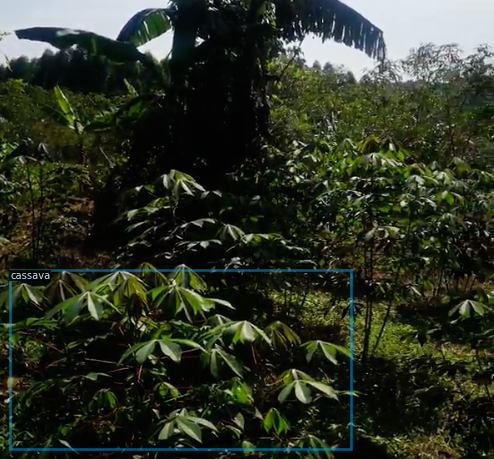

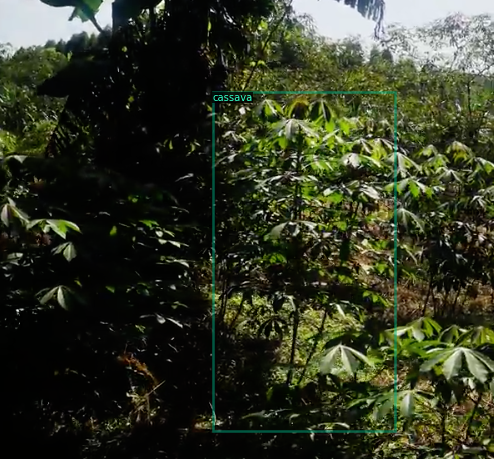

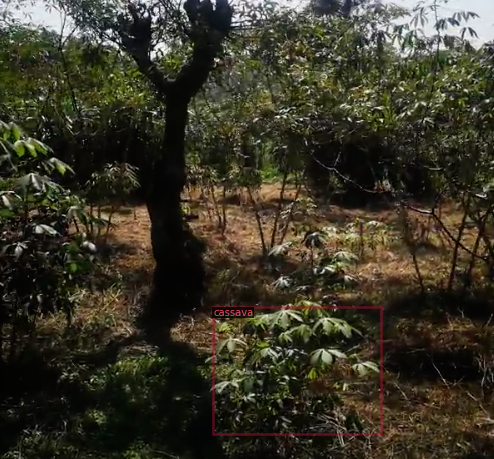

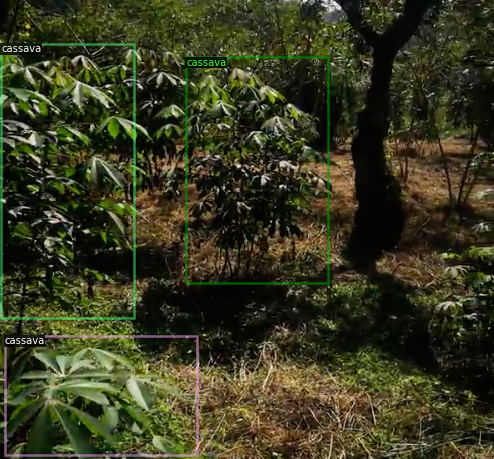

In [24]:
import random

for d in random.sample(dataset_dicts, 4):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=sample_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [25]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("cassava3_train",)
cfg.DATASETS.TEST = ("cassava3_test",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 500    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[01/21 10:59:04 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, we

[01/21 10:59:04 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[01/21 10:59:11 d2.utils.events]:  eta: 0:02:48  iter: 19  total_loss: 1.193  loss_cls: 0.7327  loss_box_reg: 0.4095  loss_rpn_cls: 0.03721  loss_rpn_loc: 0.007632  time: 0.3395  data_time: 0.0194  lr: 9.7405e-06  max_mem: 3272M
[01/21 10:59:17 d2.utils.events]:  eta: 0:02:33  iter: 39  total_loss: 1.07  loss_cls: 0.5672  loss_box_reg: 0.4199  loss_rpn_cls: 0.03641  loss_rpn_loc: 0.009059  time: 0.3294  data_time: 0.0077  lr: 1.9731e-05  max_mem: 3272M
[01/21 10:59:24 d2.utils.events]:  eta: 0:02:28  iter: 59  total_loss: 0.9089  loss_cls: 0.4091  loss_box_reg: 0.491  loss_rpn_cls: 0.02544  loss_rpn_loc: 0.008381  time: 0.3311  data_time: 0.0060  lr: 2.972e-05  max_mem: 3272M
[01/21 10:59:31 d2.utils.events]:  eta: 0:02:21  iter: 79  total_loss: 0.8128  loss_cls: 0.3396  loss_box_reg: 0.4601  loss_rpn_cls: 0.01405  loss_rpn_loc: 0.009612  time: 0.3322  data_time: 0.0059  lr: 3.9711e-05  max_mem: 3272M
[01/21 10:59:38 d2.utils.events]:  eta: 0:02:15  iter: 99  total_loss: 0.9736  loss_c

In [26]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 789), started 0:41:32 ago. (Use '!kill 789' to kill it.)

<IPython.core.display.Javascript object>

In [27]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8   # set a custom testing threshold
cfg.DATASETS.TEST = ("cassava3_test", )
predictor = DefaultPredictor(cfg)

WARNING [01/21 11:18:41 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/21 11:18:41 d2.data.datasets.coco]: Loaded 4 images in COCO format from /content/drive/MyDrive/images/val/output.json


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


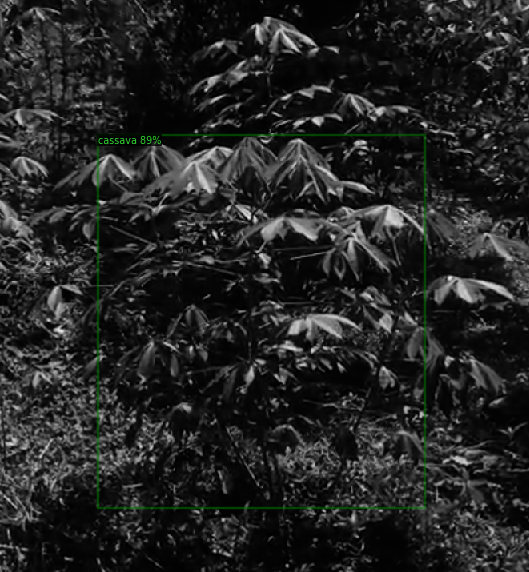

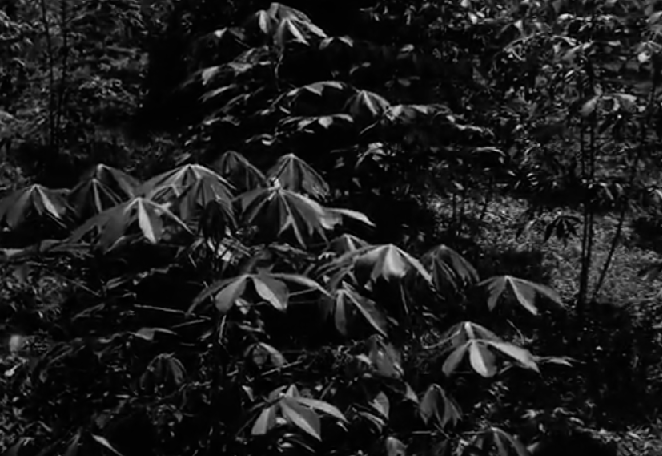

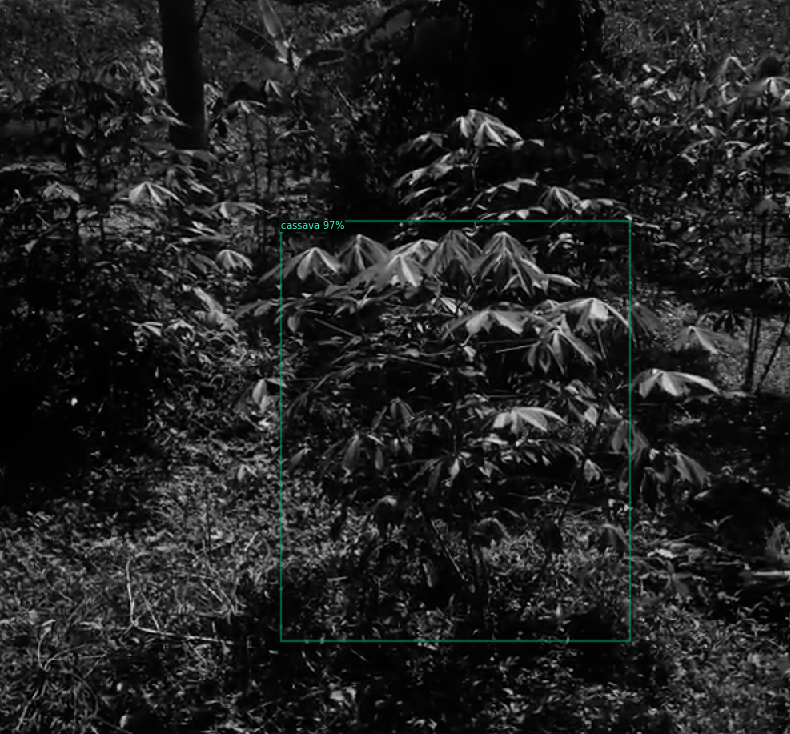

In [29]:
from detectron2.utils.visualizer import ColorMode

# expose testing set
test_metadata = MetadataCatalog.get("cassava3_test")
test_dicts = DatasetCatalog.get("cassava3_test")

for d in random.sample(test_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=sample_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu")) #pass predictions to cpu
    cv2_imshow(v.get_image()[:, :, ::-1])

In [30]:
#import the COCO Evaluator to use the COCO Metrics
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

#Call the COCO Evaluator function and pass the Validation Dataset
evaluator = COCOEvaluator("cassava3_test", cfg, False, output_dir="/output/")
val_loader = build_detection_test_loader(cfg, "cassava3_test")

#Use the created predicted model in the previous step
inference_on_dataset(predictor.model, val_loader, evaluator)


WARNING [01/21 11:33:39 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [01/21 11:33:39 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/21 11:33:39 d2.data.datasets.coco]: Loaded 4 images in COCO format from /content/drive/MyDrive/images/val/output.json
[01/21 11:33:39 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/21 11:33:39 d2.data.common]: Serializing 4 elements to byte tensors and concatenating them all ...
[01/21 11:33:39 d2.data.common]: Serialized dataset takes 0.00 MiB
[01/21 11:33:39 d2.evaluation.evaluator]: Start inference on 4 batches


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[01/21 11:33:40 d2.evaluation.evaluator]: Total inference time: 0:00:00.146849 (0.146849 s / iter per device, on 1 devices)
[01/21 11:33:40 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.077746 s / iter per device, on 1 devices)
[01/21 11:33:40 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[01/21 11:33:40 d2.evaluation.coco_evaluation]: Saving results to /output/coco_instances_results.json
[01/21 11:33:40 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[01/21 11:33:40 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[01/21 11:33:40 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[01/21 11:33:40 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[01/21 11:33:40 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.00 seconds.
 Average Precision  (AP) 

OrderedDict([('bbox',
              {'AP': 45.54455445544555,
               'AP50': 75.24752475247524,
               'AP75': 25.742574257425744,
               'APl': 45.54455445544555,
               'APm': nan,
               'APs': nan})])